In [37]:
from mesa import Agent, Model
from mesa.space import SingleGrid
from mesa.time import BaseScheduler
from mesa.datacollection import DataCollector

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

import numpy as np
import pandas as pd

import time
import datetime
import random
import json

from http.server import BaseHTTPRequestHandler, HTTPServer
import logging


In [38]:
def get_grid(model):
    grid = np.zeros( (model.grid.width, model.grid.height) )
    for (content, x, y) in model.grid.coord_iter(): 
        if (model.grid.is_cell_empty((x, y)) == False):
            grid[x][y] = content.isActive
    return grid

In [39]:

class CarAgent(Agent):
    def __init__(self, unique_id, model, x, y):
        super().__init__(unique_id, model)
        
        self.isActive = True
        self.x = x
        self.y = y
        self.move = True
        self.speed = 60

        

    def step(self):
  
        #Si eres cierto auto y llevas mitad de camino detente
        
        if self.unique_id == 30 and self.y >= self.model.quint:
            self.speed -= 5
            self.move = False
            if self.speed <= 0:
                self.speed = 0
                return
            else:
                if self.check_Fneighbors() == True:
                    self.y = self.y + 1
                    self.model.grid.move_agent(self, (self.x, self.y))
                    #print("Moverse hacia enfrente")
                else:
                #De no ser posible escoge entre derecha-izquierda
                    rand = np.random.choice([1,2])
                #Muevete a la Derecha
                    if rand == 1 and self.check_Rneighbors() == True:
                        self.x = self.x + 1
                        self.model.grid.move_agent(self, (self.x, self.y))
                        #print("Moverse hacia la derecha")
                    #Si no muevete al izquierda
                    elif self.check_Lneighbors() == True:
                        self.x = self.x - 1
                        self.model.grid.move_agent(self, (self.x, self.y))
                        #print("Moverse hacia la izquierda") 
        else:
            if self.check_Fneighbors() == True:
                self.y = self.y + 1
                self.model.grid.move_agent(self, (self.x, self.y))
                #print("Moverse hacia enfrente")
            else:
                #De no ser posible escoge entre derecha-izquierda
                rand = np.random.choice([1,2])
                self.speed = 0
                #Muevete a la Derecha
                if rand == 1 and self.check_Rneighbors() == True:
                    self.x = self.x + 1
                    self.model.grid.move_agent(self, (self.x, self.y))
                    #print("Moverse hacia la derecha")
                #Si no muevete al izquierda
                elif self.check_Lneighbors() == True:
                    self.x = self.x - 1
                    self.model.grid.move_agent(self, (self.x, self.y))
                    #print("Moverse hacia la izquierda")
                        

    #Sal del camino si llegaste al limite
    def get_out(self):
        if self.model.grid.out_of_bounds((self.x, (self.y + 1))) == True:
            return True
        return False


    #Verifica si puedes moverte hacia enfrente y manda afirmativo
    def check_Fneighbors(self):
        if self.get_out() == True and not(self in self.model.out):
            self.model.out.append(self)
            return False
        else:
            if self.get_out() == False and self.model.grid.is_cell_empty((self.x, (self.y + 1))) == True:
                return True
            else:
                self.model.trafic.append(self)
                return False
                
    #Verifica si puedes moverte hacia la derecha y manda afirmativo
    def check_Rneighbors(self):
        if self.get_out() == True and not(self in self.model.out):    
            self.model.out.append(self)
            return False
        else:
            if ((self.x + 1) <= 2) and (self.y < self.model.height):
                if  self.get_out() == False and self.model.grid.is_cell_empty(((self.x + 1), (self.y))) == True:
                    return True
                else:
                    return False
            return False


    #Verifica si puedes moverte hacia la izquierda y manda afirmativo
    def check_Lneighbors(self):
        if self.get_out() == True and not(self in self.model.out):
            self.model.out.append(self)
            return False  
        else:
            if((self.x - 1) >= 0) and (self.y < self.model.height):
                if  self.get_out() == False and self.model.grid.is_cell_empty(((self.x - 1), (self.y))) == True:
                    return True
                else:
                    return False
            return False

In [40]:
class CarModel(Model):
    def __init__(self, width, height):
        self.uids = 1
        self.quint = height / 5
        self.out = []
        self.widht = width
        self.height = height
        self.grid = SingleGrid(width, height, False)
        self.schedule = BaseScheduler(self)
        self.datacollector = DataCollector(model_reporters={"Grid": get_grid})
        self.prob = 0.5
        self.stop = False
        self.trafic = []
  
        
        
    def step(self): 
        self.datacollector.collect(self)
        for agent in self.out:
            #print("Delete")
            self.grid.remove_agent(agent)
            self.schedule.remove(agent)
            #self.agents.remove(agent)
        self.out = [] 
        self.schedule.step()
        rand = np.random.choice([0.1,0.2,0.3,0.5,0.6,0.7,0.8,0.9,1])
        if rand <= self.prob:
            if self.uids == 30:
                agent = CarAgent(self.uids, self, 1, 0)
                self.grid.place_agent(agent, (1, 0))
                self.schedule.add(agent)
                self.uids += 1
            else:
                pos = np.random.choice([0, 1, 2])
                agent = CarAgent(self.uids, self, pos, 0)
                self.grid.place_agent(agent, (pos, 0))
                self.schedule.add(agent)
                self.uids += 1
        print(len(self.trafic))

In [41]:
WIDTH = 3
HEIGHT = 100
MAX_ITERATIONS = 300


start_time = time.time()
model = CarModel(WIDTH, HEIGHT)

for i in range(MAX_ITERATIONS):
    model.step()
    
print("Tiempo de ejcucion: ", str(datetime.timedelta( seconds = (time.time() - start_time))))

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
2
2
2
2
2
2
2
2
3
3
5
5
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
7
7
8
12
12
13
13
14
14
15
15
15
15
15
15
17
17
17
17
17
17
17
17
17
17
17
18
18
18
18
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
19
20
20
20
20
20
20
20
21
21
21
21
21
21
22
22
22
23
23
23
23
23
24
24
25
25
25
26
26
26
26
27
28
29
29
29
29
29
29
29
30
30
30
31
31
31
31
32
32
34
34
35
35
35
35
36
36
37
37
37
37
39
39
40
43
43
43
44
44
44
44
45
47
47
49
51
51
53
53
54
54
54
54
54
54
54
54
54
54
54
54
55
55
55
55
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
57
57
58
58
58
61
61
63
Tiempo de ejcucion:  0:00:00.073802


In [42]:
all_grid = model.datacollector.get_model_vars_dataframe()
print(all_grid)

                                                  Grid
0    [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
1    [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
2    [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
3    [[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
4    [[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
..                                                 ...
295  [[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
296  [[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,...
297  [[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0,...
298  [[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0,...
299  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0,...

[300 rows x 1 columns]


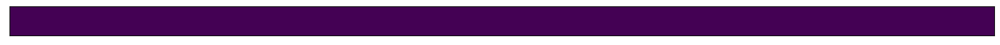

In [43]:
fig, axs = plt.subplots(figsize = (20, 20))
axs.set_xticks([])
axs.set_yticks([])
patch = plt.imshow(all_grid.iloc[i][0])

def animate(i):
    patch.set_data(all_grid.iloc[i][0])

anim = animation.FuncAnimation(fig, animate, frames = MAX_ITERATIONS)

In [44]:
anim